<a href="https://colab.research.google.com/github/rocket0l4/Image_classification/blob/main/project_DL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Uploding Data form Kaggle.com
#Animals Dataset.
#Unzipping Uploaded Dataset

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download -d alessiocorrado99/animals10

Dataset URL: https://www.kaggle.com/datasets/alessiocorrado99/animals10
License(s): GPL-2.0
 97% 569M/586M [00:04<00:00, 131MB/s]
100% 586M/586M [00:04<00:00, 125MB/s]


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/animals10.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

#Importing Libraries

In [ ]:
#Import libraries
import os  # For interacting with the file system
import shutil  # For managing files and directories in a cross-platform manner
import keras  # For building deep learning models
import numpy as np  # For numerical operations on arrays
from glob import glob  # For finding file paths
from tqdm import tqdm  # For progress bars

# Data preprocessing
from keras.preprocessing.image import ImageDataGenerator  # For image data augmentation

# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots

# Model architecture
from keras import Sequential  # For building sequential models
from keras.models import load_model  # For loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  # For defining model layers

# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models

#Obtaining Class names and Counting Classes

In [ ]:
# Set the path to the dataset
data_path = '/content/raw-img'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)

Class Names: 
 ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
Number of Classes: 10


#Examining Class Distribution in the Dataset


In [ ]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [4863, 2623, 1446, 2112, 3098, 1668, 1866, 1820, 4821, 1862]


# Visualizing Class Distribution in the Dataset using a Pie Chart and Bar Graph

In [ ]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

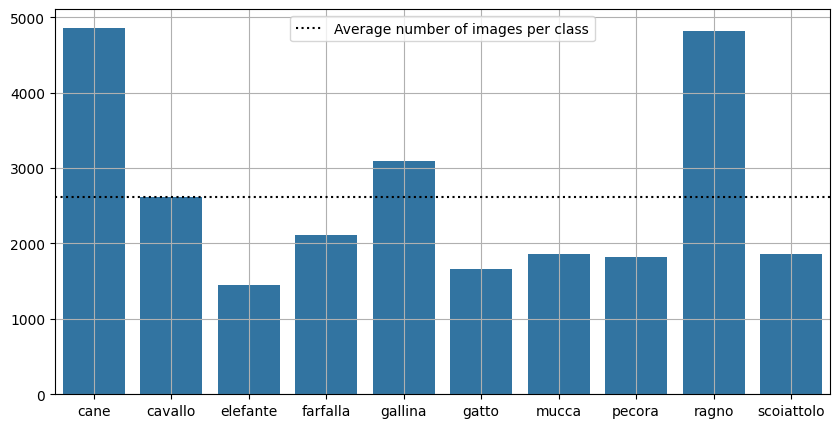

In [ ]:
#Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

#Sampling and Creating Sampled Data Directory

In [ ]:
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

# Define a dictionary that maps the original class names to their English names
class_names_dict = {
    'cane': 'dog',
    'cavallo': 'horse',
    'elefante': 'elephant',
    'farfalla': 'butterfly',
    'gallina': 'chicken',
    'gatto': 'cat',
    'mucca': 'cow',
    'pecora': 'sheep',
    'ragno': 'spider',
    'scoiattolo': 'squirrel'
}

# Loop through each class directory and copy a percentage of the images to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Get the English name of the class
    class_name_en = class_names_dict[class_name]
    # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory if it doesn't exist
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
    # Get a list of all the image files in the class directory
    image_files = os.listdir(class_path)
    # Calculate the number of images to sample
    num_images = int(len(image_files) * sample_percent)
    # Sample the images
    sampled_images = np.random.choice(image_files, size=num_images, replace=False)
    # Copy the sampled images to the sampled class directory
    for image_name in sampled_images:
        src_path = os.path.join(class_path, image_name)
        dst_path = os.path.join(sampled_class_path, image_name)
        shutil.copyfile(src_path, dst_path)

In [ ]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [211, 166, 309, 186, 486, 144, 262, 182, 482, 186]


In [ ]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

#Data Preparation and Augmentation

In [ ]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation')

Found 2095 images belonging to 10 classes.
Found 519 images belonging to 10 classes.


#Data Visualization

In [ ]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)

    # Set the title of the plot if provided
    plt.title(image_title)

    # Turn off the axes in the plot
    plt.axis('off')

In [ ]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label

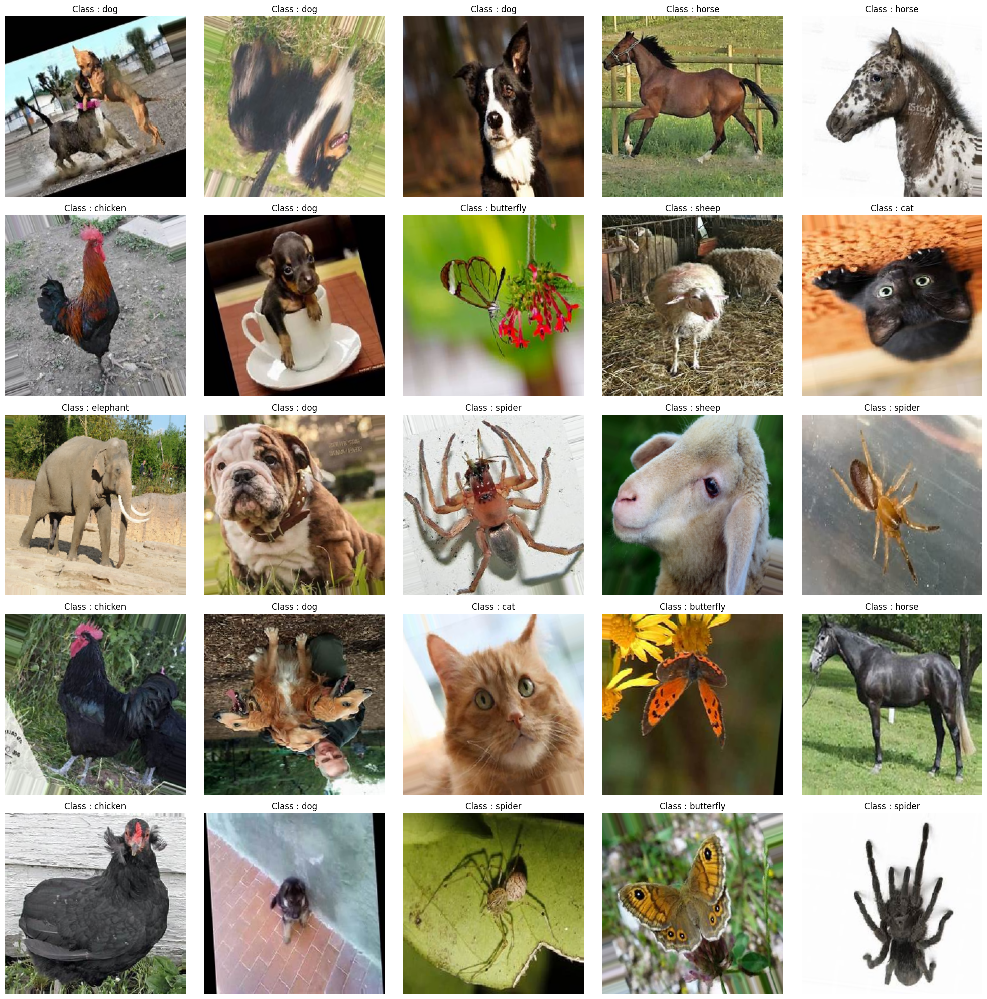

In [ ]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):

    # Get a random image and label
    image, label = get_random_data([images, labels])

    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")

    # Increment the counter
    counter+=1

    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

#Model Training

In [ ]:
# Specify the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Load the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

234545216/234545216 [==============================] - 1s 0us/step
Epoch 1/50
66/66 [==============================] - ETA: 0s - loss: 0.7157 - accuracy: 0.7733

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



66/66 [==============================] - 83s 1s/step - loss: 0.7157 - accuracy: 0.7733 - val_loss: 0.4661 - val_accuracy: 0.8555
Epoch 2/50
66/66 [==============================] - 52s 782ms/step - loss: 0.3460 - accuracy: 0.8816 - val_loss: 0.2953 - val_accuracy: 0.9056
Epoch 3/50
66/66 [==============================] - 50s 760ms/step - loss: 0.2771 - accuracy: 0.9117 - val_loss: 0.3465 - val_accuracy: 0.8825
Epoch 4/50
66/66 [==============================] - 50s 760ms/step - loss: 0.2526 - accuracy: 0.9169 - val_loss: 0.2811 - val_accuracy: 0.9037
Epoch 5/50
66/66 [==============================] - 50s 754ms/step - loss: 0.2068 - accuracy: 0.9279 - val_loss: 0.3316 - val_accuracy: 0.8921
Epoch 6/50
66/66 [==============================] - 50s 756ms/step - loss: 0.1816 - accuracy: 0.9389 - val_loss: 0.3083 - val_accuracy: 0.8940
Epoch 7/50
66/66 [==============================] - 50s 762ms/step - loss: 0.1665 - accuracy: 0.9432 - val_loss: 0.3778 - val_accuracy: 0.8882


In [ ]:
# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
inception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/50
66/66 [==============================] - 56s 724ms/step - loss: 0.8471 - accuracy: 0.7356 - val_loss: 0.5238 - val_accuracy: 0.8382
Epoch 2/50
66/66 [==============================] - 44s 665ms/step - loss: 0.4518 - accuracy: 0.8496 - val_loss: 0.3545 - val_accuracy: 0.9037
Epoch 3/50
66/66 [==============================] - 44s 664ms/step - loss: 0.4327 - accuracy: 0.8601 - val_loss: 0.3874 - val_accuracy: 0.8825
Epoch 4/50
66/66 [==============================] - 43s 658ms/step - loss: 0.3916 - accuracy: 0.8768 - val_loss: 0.3556 - val_accuracy: 0.8767
Epoch 5/50
66/66 [==============================] - 45s 690ms/step - loss: 0.3570 - accuracy: 0.8764 - val_loss: 0.4046 - val_accuracy: 0.8728


In [ ]:
# Specify the name of the model as "Xception".
name = "Xception"

# Load the pre-trained Xception model, freeze its weights and exclude its final classification layer.
base_model = Xception(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the Xception base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
xception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
xception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
xception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)

83683744/83683744 [==============================] - 0s 0us/step
Epoch 1/50
66/66 [==============================] - 56s 740ms/step - loss: 0.8079 - accuracy: 0.7551 - val_loss: 0.3711 - val_accuracy: 0.8651
Epoch 2/50
66/66 [==============================] - 46s 699ms/step - loss: 0.4111 - accuracy: 0.8673 - val_loss: 0.3315 - val_accuracy: 0.9037
Epoch 3/50
66/66 [==============================] - 45s 681ms/step - loss: 0.3559 - accuracy: 0.8878 - val_loss: 0.3451 - val_accuracy: 0.8940
Epoch 4/50
66/66 [==============================] - 48s 722ms/step - loss: 0.3022 - accuracy: 0.8993 - val_loss: 0.2940 - val_accuracy: 0.9094
Epoch 5/50
66/66 [==============================] - 45s 678ms/step - loss: 0.2566 - accuracy: 0.9126 - val_loss: 0.3074 - val_accuracy: 0.9017
Epoch 6/50
66/66 [==============================] - 47s 714ms/step - loss: 0.2572 - accuracy: 0.9122 - val_loss: 0.3565 - val_accuracy: 0.8921
Epoch 7/50
66/66 [==============================] - 45s 683ms/step - loss: 0.

#Loading a Pre-trained ResNet152V2 Model and Printing its Summary.

In [ ]:
# set the file path to the pre-trained model
model_file_path = '/content/ResNet152V2.h5'

# load the pre-trained model
loaded_model = load_model(model_file_path)

# print a summary of the model's architecture
loaded_model.summary()

Model: "ResNet152V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                2570      
                                                                 
Total params: 58858762 (224.53 MB)
Trainable params: 527114 (2.01 MB)
Non-trainable params: 58331648 (222.52 MB)
________

#Evaluation of Pre-trained ResNet152V2 Model on Validation Dataset.

In [ ]:
#This line of code evaluates the performance of the pre-trained model on the validation dataset.
loaded_model.evaluate(valid_data)

17/17 [==============================] - 13s 540ms/step - loss: 0.3006 - accuracy: 0.9075


[0.30056697130203247, 0.9075144529342651]

1/1 [==============================] - 0s 31ms/step


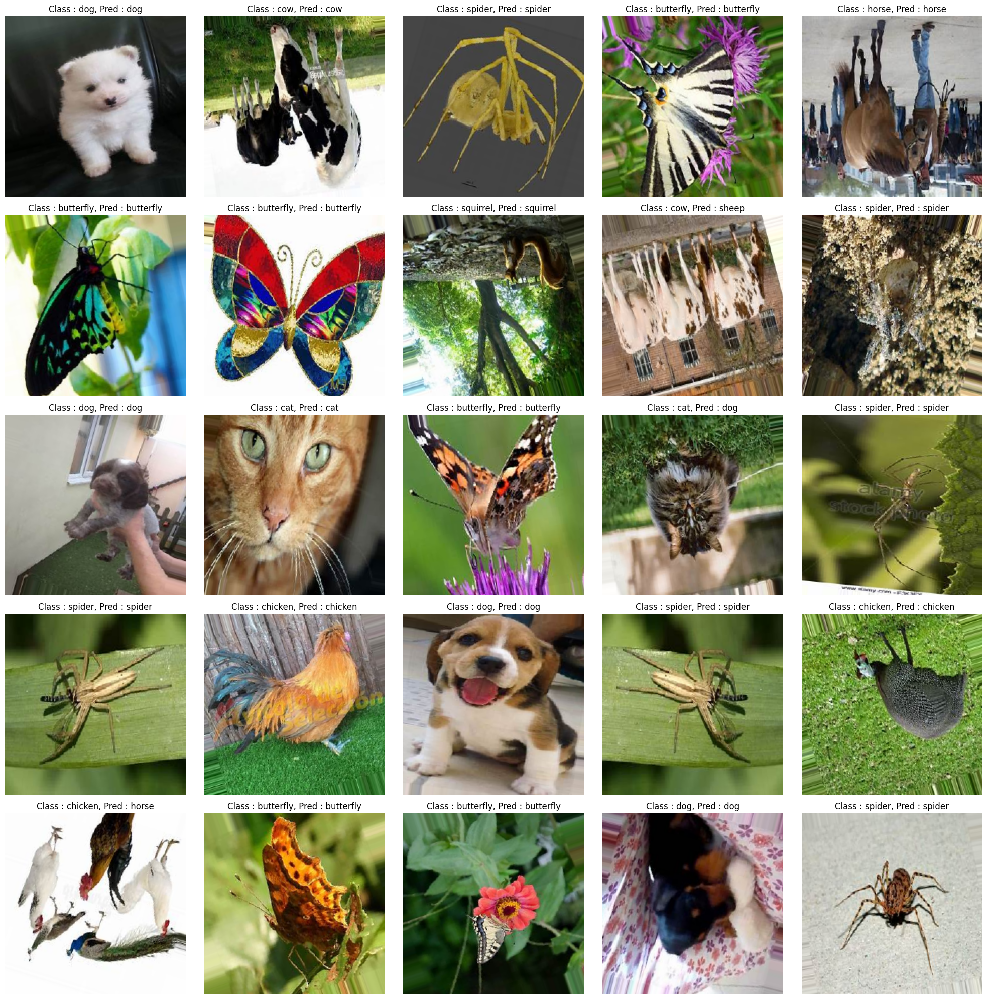

In [ ]:

plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):

    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]

    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")

    # Make sure to end the Loop
    i+=1
    if i>=26: break


plt.tight_layout()
plt.show()
